<a href="https://colab.research.google.com/github/d1m3j1/Russia-Ukraine-War/blob/new_branch/RUS_v_UKR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###Importing Libraries 

In [1]:
!pip3 freeze > requirements.txt

In [ ]:
import re
import os
import csv
import nltk
import json
import lxml
import math
import spacy
import plotly
import requests 
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
from datetime import date 
import plotly.express as px
from textblob import TextBlob
from datetime import datetime
from datetime import timedelta
from nltk.stem.porter import *
import plotly.graph_objs as go
import matplotlib.pyplot as plt 
from collections import Counter
from nltk.corpus import stopwords
import plotly.figure_factory as ff
from urllib.request import urlopen 
from bs4 import BeautifulSoup as soup
from nltk.tokenize import word_tokenize 
from nltk.stem import WordNetLemmatizer
from IPython.display import clear_output
from pandas.io.json import json_normalize
from plotly.subplots import make_subplots
from nltk.corpus import sentiwordnet as swn
plotly.offline.init_notebook_mode (connected = True)
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#UKRAINE REFUGEE SITUATION

In [ ]:
link_1 = 'https://data2.unhcr.org/population/get/timeseries?widget_id=284344&sv_id=54&population_group=5457&frequency=day&fromDate=1900-01-01'
link_2 = 'https://data2.unhcr.org/population/get/sublocation?widget_id=284342&sv_id=54&population_group=5459,5460&forcesublocation=0&fromDate=1900-01-01'
country = json.load(open('custom.geo.json', 'r'))

In [ ]:
data = urlopen(link_1)
data_2 = urlopen(link_2)

df_1 = pd.DataFrame(columns = ['Date', 'Timestamp', 'Individuals'])
df_2 = pd.DataFrame(columns = ['Country', 'Date', 'Cen Lon', 'Cen Lat', 'Lat Max', 'Lon Max', 'Count'])
data_json = json.loads(data.read()) 
data_json_2 = json.loads(data_2.read())

for item in range(len(data_json['data']['timeseries'])):
  df_1.loc[item] = data_json['data']['timeseries'][item]['data_date'], data_json['data']['timeseries'][item]['unix_timestamp'], data_json['data']['timeseries'][item]['individuals']
for item_2 in range(len(data_json_2['data'])):
  df_2.loc[item_2] = data_json_2['data'][item_2]['geomaster_name'],data_json_2['data'][item_2]['date'], \
                     data_json_2['data'][item_2]['centroid_lon'], data_json_2['data'][item_2]['centroid_lat'], \
                     data_json_2['data'][item_2]['lat_max'], data_json_2['data'][item_2]['lon_max'], \
                     data_json_2['data'][item_2]['individuals'] 


In [ ]:
country['features'][0].keys()

dict_keys(['type', 'properties', 'geometry'])

In [ ]:
#Renaming Country in Geojson Files
country['features'][6]['properties']['name'] = 'Republic of Moldova'
country['features'][3]['properties']['name'] = 'Russian Federation'

In [ ]:
#Creating id row for Geojson files 
state_id_map = {}
for feature in country['features']:
  feature['id'] = feature['properties']['abbrev']
  state_id_map[feature['properties']['name']] = feature['id']

#Merging Geojson file with refugge file
df_2['id'] = df_2['Country'].apply(lambda x: state_id_map[x])
df_2

,Country,Date,Cen Lon,Cen Lat,Lat Max,Lon Max,Count,id
0,Poland,2022-04-13,19.4013,52.1224,55.469506,26.401300,2694090,Pol.
1,Russian Federation,2022-04-13,38.1556078125,51.488850139616,59.067055,36.958298,471014,Rus.
2,Hungary,2022-04-13,19.4131,47.1672,54.167200,26.588881,440387,Hun.
3,Republic of Moldova,2022-04-13,28.4646,47.1976,49.019638,31.685303,417650,Mda.
4,Romania,2022-04-13,25.3,45.8667,52.866700,32.300000,364658,Rom.
5,Slovakia,2022-04-13,19.4864,48.7062,55.706200,26.486400,326244,Svk.
6,Belarus,2022-04-13,28.0463,53.5384,57.838934,33.727941,22428,Bela.


###Country Ukrainian Citizen Fled to

In [ ]:
#Choropleth plot of Map of Country Ukrainian citizen Fled to 
fig = px.choropleth_mapbox(df_2,
                           locations = 'id', 
                           geojson = country, 
                           color = 'Count', 
                           center = {'lat' : 57.838934, 'lon' : 33.727941},
                           hover_name = 'Country',
                           zoom = 3.5,
                           mapbox_style = 'carto-positron')

fig.update_layout(title = 'Countries Ukrainian Citizen\'s Fled To', width = 1000, height = 1000)
fig.show(renderer = 'colab')

In [ ]:
fig = px.bar(df_1, x = 'Date', y = 'Individuals', text_auto = True)
fig.update_layout(title = 'Total Refugee influx from Ukraine in neighbouring countries', width = 1200, height = 500)
fig.show(renderer= 'colab')

#EQUIPMENT LOSS / PERSONNEL LOSS


In [ ]:
equipment_loss = pd.read_json('https://raw.githubusercontent.com/PetroIvaniuk/2022-Ukraine-Russia-War-Dataset/main/data/russia_losses_equipment.json')
personnel_loss = pd.read_json('https://raw.githubusercontent.com/PetroIvaniuk/2022-Ukraine-Russia-War-Dataset/main/data/russia_losses_personnel.json')
equipment_loss['date'] = pd.to_datetime(equipment_loss['date'])
personnel_loss['date'] = pd.to_datetime(personnel_loss['date'])

In [ ]:
equipment_loss.head()

,date,day,aircraft,helicopter,tank,APC,field artillery,MRL,military auto,fuel tank,drone,naval ship,anti-aircraft warfare,special equipment,mobile SRBM system
0,2022-02-25,2,10,7,80,516,49,4,100,60,0,2,0,NaN,NaN
1,2022-02-26,3,27,26,146,706,49,4,130,60,2,2,0,NaN,NaN
2,2022-02-27,4,27,26,150,706,50,4,130,60,2,2,0,NaN,NaN
3,2022-02-28,5,29,29,150,816,74,21,291,60,3,2,5,NaN,NaN
4,2022-03-01,6,29,29,198,846,77,24,305,60,3,2,7,NaN,NaN


In [ ]:
personnel_loss.head()

,date,day,personnel,personnel*,POW
0,2022-02-25,2,2800,about,0
1,2022-02-26,3,4300,about,0
2,2022-02-27,4,4500,about,0
3,2022-02-28,5,5300,about,0
4,2022-03-01,6,5710,about,200


In [ ]:
equipment_loss['special equipment'] = equipment_loss['special equipment'].fillna(0)
equipment_loss['mobile SRBM system'] = equipment_loss['mobile SRBM system'].fillna(0)

In [ ]:
#getting a string object containing the last date of data update
last_index = len(equipment_loss.index) - 1
last_date = equipment_loss['date'][last_index].date().strftime("%d %B %Y")
print(f"Latest data as of {last_date}") 


Latest data as of 13 April 2022


In [ ]:
#Sorting the latest data from the highest cumulative losses to lowest + Transposing to make feature columns into index
latest_day_data = equipment_loss.iloc[-1:,2:].sort_values(by=[last_index],axis=1,ascending=False).T
latest_day_data.rename(columns = {last_index:'unit_amount'}, inplace = True)
print(latest_day_data.head())

                 unit_amount
APC                   1964.0
military auto         1429.0
tank                   739.0
field artillery        358.0
aircraft               158.0


In [ ]:
#Data Manipulation, categorizing units based on air, ground, or naval units.
air_units = ['helicopter', 'aircraft', 'drone']
naval_units = ['naval ship']
ground_units = ['APC', 'military auto', 'tank', 'field artillery', 'fuel tank', 'MRL','anti-aircraft warfare', 'special equipment', 'mobile SRBM system']
air_and_naval_units = ['helicopter', 'aircraft', 'drone', 'naval ship']

equipment_loss['Total Air Units'] = equipment_loss[air_units].sum(axis=1)
equipment_loss['Total Naval Units'] = equipment_loss[naval_units].sum(axis=1)
equipment_loss['Total Ground Units'] = equipment_loss[ground_units].sum(axis=1)
equipment_loss.head()


,date,day,aircraft,helicopter,tank,APC,field artillery,MRL,military auto,fuel tank,drone,naval ship,anti-aircraft warfare,special equipment,mobile SRBM system,Total Air Units,Total Naval Units,Total Ground Units
0,2022-02-25,2,10,7,80,516,49,4,100,60,0,2,0,0.0,0.0,17,2,809.0
1,2022-02-26,3,27,26,146,706,49,4,130,60,2,2,0,0.0,0.0,55,2,1095.0
2,2022-02-27,4,27,26,150,706,50,4,130,60,2,2,0,0.0,0.0,55,2,1100.0
3,2022-02-28,5,29,29,150,816,74,21,291,60,3,2,5,0.0,0.0,61,2,1417.0
4,2022-03-01,6,29,29,198,846,77,24,305,60,3,2,7,0.0,0.0,61,2,1517.0


In [ ]:
#Preparing data for charts
def impute_unit(unit_name):
    if unit_name in air_units:
        return "Air Units"
    elif unit_name in naval_units:
        return "Naval Units"
    else:
        return "Ground Units"

new_df = latest_day_data
new_df.reset_index(inplace=True)
new_df = new_df.rename(columns = {'index':'equipment_name'})

#performing data manipulation, imputing categorized unit type into a new column
new_df['unit_type'] = new_df['equipment_name'].apply(lambda x: impute_unit(x))
new_df.head()

,equipment_name,unit_amount,unit_type
0,APC,1964.0,Ground Units
1,military auto,1429.0,Ground Units
2,tank,739.0,Ground Units
3,field artillery,358.0,Ground Units
4,aircraft,158.0,Air Units


###Visualization of Equipment Loss

In [ ]:
fig= px.line(personnel_loss,x='date', y='personnel')
fig.update_traces(textfont_size=12, cliponaxis=False)
fig.update_layout(
     width = 1200, height = 500,
    xaxis_title="Date",
    yaxis_title="Number of Personnel Losses")
fig.show(renderer = 'colab')

In [ ]:
#Simple bar chart plot of Equipment loss
fig = px.bar(
    new_df, x='equipment_name', y='unit_amount',text_auto=True,
    title=f'Cumulated Russian Equipment Losses in Ukraine War \n(as of {last_date})'
)
fig.update_traces(textfont_size=12, textangle=0, cliponaxis=False)
fig.update_layout(
     width = 1200, height = 500,
    xaxis_title="Equipment Name",
    yaxis_title="Number of Equipment Losses")
fig.show(renderer = 'colab')

In [ ]:
fig = px.line(equipment_loss, x="date", y=air_units)
fig.update_layout(
     width = 1200, height = 500,
    xaxis_title="Equipment Name",
    yaxis_title="Number of Aircraft Losses",
    title = 'Aircraft Losses')
fig.show(renderer = 'colab')

In [ ]:
fig = px.bar(equipment_loss, x="date", y=air_units ,text_auto=True)
fig.update_layout(
     width = 1500, height = 500,
    xaxis_title="Equipment Name",
    yaxis_title="Number of Aircraft Losses",
    title="Total air weapons losses of Russia each day in war")
fig.show(renderer = 'colab')

In [ ]:
fig = px.line(equipment_loss, x="date", y=ground_units)
fig.update_layout(
     width = 1200, height = 500,
    xaxis_title="Equipment Name",
    yaxis_title="Number of Ground Losses",
    title = 'Aircraft Losses')
fig.show(renderer = 'colab')

In [ ]:
fig = px.bar(equipment_loss, x="date", y=ground_units ,text_auto=True)
fig.update_layout(
     width = 1500, height = 500,
    xaxis_title="Equipment Name",
    yaxis_title="Number of Aircraft Losses",
    title="Total air weapons losses of Russia each day in war")
fig.show(renderer = 'colab')

#SANCTIONS 

In [ ]:
sanctions_list = 'https://data.opensanctions.org/datasets/latest/sanctions/targets.nested.json'
sanction_json = urlopen(sanctions_list)
sanction_data = pd.read_json(sanction_json, lines = True)

In [ ]:
def new_field(data, field): 
  try: 
    data.get('sanctions')[0].get('properties').get(field)
    return data.get('sanctions')[0].get('properties').get(field)
  except TypeError:  
    return []
def new_field_2(data_2, field_2):
  try: 
    data_2.get(field_2)
    return data_2.get(field_2)
  except TypeError:  
    return []

sanction_data['Body'] = sanction_data.properties.apply(lambda x : new_field(x, 'authority'))
sanction_data['Sanctioned_by'] = sanction_data.properties.apply(lambda x : new_field(x, 'country'))
sanction_data['Source'] = sanction_data.properties.apply(lambda x : new_field(x, 'sourceUrl'))
sanction_data['sanction_date'] = sanction_data.properties.apply(lambda x : new_field_2(x, 'createdAt'))

In [ ]:
sanction_data_2 = sanction_data.drop('Body', axis = 1).join(sanction_data.Body.explode())
sanction_data_3 = sanction_data_2.drop('Sanctioned_by', axis = 1).join(sanction_data.Sanctioned_by.explode())
sanction_data_4 = sanction_data_3.drop('Source', axis = 1).join(sanction_data.Source.explode())
sanction_data_5 = sanction_data_4.drop('sanction_date', axis = 1).join(sanction_data.sanction_date.explode())
sanction_data_5['sanction_date'] = sanction_data_5['sanction_date'].apply(lambda x : pd.to_datetime(x))
sanction_data_5.sort_values(by='sanction_date', ascending = False, inplace = True)

In [ ]:
def date_replace(date_val):
  try:
     date_val.strftime('%d-%m-%Y')
     return date_val.strftime('%d-%m-%Y')
  except (ValueError, AttributeError): 
      pass
sanction_data_5['sanction_date'] = sanction_data_5['sanction_date'].apply(lambda x: date_replace(x))

In [ ]:
all_sanctions = sanction_data_5[['caption', 'schema', 'Body', 'Sanctioned_by', 'sanction_date', 'Source']].reset_index(drop = 'index')
all_sanctions.rename(columns = {'caption' : 'Name', 'schema' : 'Type'}, inplace= True)

###Latest Sanctions

In [ ]:
all_sanctions

,Name,Type,Body,Sanctioned_by,sanction_date,Source
0,DAVIDOVICH David Lvovich,Person,Office of Financial Sanctions Implementation,gb,14-04-2022,https://www.gov.uk/government/publications/fin...
1,DAVIDOVICH David Lvovich,Person,UK,gb,14-04-2022,https://www.gov.uk/government/publications/fin...
2,Eugene TENENBAUM,Person,UK,gb,14-04-2022,https://www.gov.uk/government/publications/fin...
3,Eugene TENENBAUM,Person,Office of Financial Sanctions Implementation,gb,14-04-2022,https://www.gov.uk/government/publications/fin...
4,Pavel EZOUBOV,Person,UK,gb,13-04-2022,https://www.gov.uk/government/publications/fin...
...,...,...,...,...,...,...
25222,Аль-Хамалі Мохамед,Person,National Security and Defense Council,ua,None,https://sanctions-t.rnbo.gov.ua/
25223,Омельченко Александр Анатольевич,Person,National Security and Defense Council,ua,None,https://sanctions-t.rnbo.gov.ua/
25224,Ананьев Алексей Николаевич,Person,National Security and Defense Council,ua,None,https://sanctions-t.rnbo.gov.ua/
25225,Ананьев Дмитрий Николаевич,Person,National Security and Defense Council,ua,None,https://sanctions-t.rnbo.gov.ua/


In [ ]:
latest_sanc_1 = all_sanctions.groupby(['sanction_date', 'Type'])
latest_sanc_2 = pd.DataFrame(latest_sanc_1.size().reset_index(name = 'group_count'))

In [ ]:
latest_sanc_3 = latest_sanc_2.pivot(index = 'sanction_date', columns= 'Type', values = 'group_count')
latest_sanc_3.columns = latest_sanc_3.columns.to_series().str.join('')
latest_sanc_3.fillna(0, inplace = True)
latest_sanc_3.reset_index(inplace = True)

In [ ]:
latest_sanc_3['sanction_date'] = pd.to_datetime(latest_sanc_3['sanction_date'], format = '%d-%m-%Y')
latest_sanc_3.set_index('sanction_date')

Type,Airplane,Company,LegalEntity,Organization,Person,Vessel
sanction_date,,,,,,
2011-02-01,0.0,0.0,0.0,8.0,10.0,0.0
2012-02-01,0.0,0.0,0.0,3.0,4.0,0.0
2013-02-01,0.0,0.0,0.0,0.0,1.0,0.0
2016-02-01,0.0,0.0,0.0,0.0,5.0,0.0
2018-02-01,0.0,0.0,0.0,0.0,4.0,0.0
...,...,...,...,...,...,...
2012-10-31,0.0,0.0,0.0,0.0,1.0,0.0
2019-10-31,0.0,0.0,2.0,0.0,0.0,0.0
2001-12-31,0.0,0.0,0.0,6.0,0.0,0.0


In [ ]:
others = ['Airplane', 'Vessel', 'LegalEntity']
company = ['Organization', 'Company']
latest_sanc_3['Other'] = latest_sanc_3[others].sum(axis = 1)
latest_sanc_3['Organization'] = latest_sanc_3[company].sum(axis = 1)
latest_sanc_4 = latest_sanc_3[['sanction_date', 'Organization', 'Person', 'Other']]
latest_sanc_4.sort_values(by = 'sanction_date', ascending = False, inplace= True)  
latest_sanc_4.reset_index(drop = True, inplace = True)

In [ ]:
latest_sanc_4.loc[latest_sanc_4['sanction_date'] == '2022-01-05']

Type,sanction_date,Organization,Person,Other
45,2022-01-05,1.0,0.0,0.0


In [ ]:
latest_sanc_4.iloc[:100].sum()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Type
Organization     644.0
Person          1702.0
Other             78.0
dtype: float64

In [ ]:
latest_sanc_4

Type,sanction_date,Organization,Person,Other
0,2022-04-14,0.0,4.0,0.0
1,2022-04-13,0.0,8.0,0.0
2,2022-04-11,5.0,16.0,0.0
3,2022-04-08,7.0,262.0,0.0
4,2022-04-07,19.0,8.0,0.0
...,...,...,...,...
1473,1989-03-30,4.0,0.0,0.0
1474,1989-01-05,1.0,0.0,2.0
1475,1986-12-10,25.0,0.0,0.0
1476,1984-07-12,1.0,0.0,0.0


###Sanctioning Body

In [ ]:
sanction_country = all_sanctions[['sanction_date', 'Sanctioned_by']]
group_sanc = sanction_country.groupby(['sanction_date', 'Sanctioned_by'])
sanction_country_2 =  pd.DataFrame(group_sanc.size().reset_index(name = 'group_count'))
sanc_country_pivot = sanction_country_2.pivot(columns ='Sanctioned_by', index = 'sanction_date', values ='group_count')
sanc_country_pivot.columns = sanc_country_pivot.columns.to_series().str.join('')
sanc_country_pivot.fillna(0, inplace = True)


In [ ]:
sanc_country_pivot.reset_index(inplace = True)
sanc_country_pivot['sanction_date'] = pd.to_datetime(sanc_country_pivot['sanction_date'], format = '%d-%m-%Y')
sanc_country_pivot.set_index('sanction_date')
sanc_country_pivot.sort_values(by = 'sanction_date', ascending = False, inplace= True)
sanc_country_pivot.reset_index(drop = True, inplace = True)
sanc_country_pivot


Sanctioned_by,sanction_date,ar,au,ca,ch,eu,gb,il,jp,kg,kz,ru,ua,us
0,2022-04-14,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2022-04-13,0.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2022-04-11,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,19.0
3,2022-04-08,0.0,0.0,5.0,55.0,59.0,136.0,0.0,5.0,0.0,0.0,0.0,9.0,0.0
4,2022-04-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,24.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1989-03-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
1456,1989-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0
1457,1986-12-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25.0
1458,1984-07-12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
sanc_plot = latest_sanc_4[:15]
sanc_plot_2 = sanc_country_pivot[:15]

In [ ]:
#Add Table Data
table_data = sanc_country_pivot.loc[:10, ['sanction_date', 'ch','eu', 'gb', 'ua', 'us']]

# remove min:sec:millisec from dates 
for i, row in enumerate(table_data['sanction_date']):
    p = re.compile(' 00:00:00')
    date = p.split(str(table_data['sanction_date'][i]))[0]
    table_data.loc[i, 2] = date
  
table_data.drop(['sanction_date'], axis=1, inplace = True)
first_col = table_data.pop(2)

table_data.insert(0, 2, first_col)
table_data.rename(columns = {2 : 'Date'}, inplace = True)

###Visualization of Recent Sanctions Towards Russia

In [ ]:
fig = go.Figure()

fig.add_trace(go.Bar(y = sanc_plot['sanction_date'], x= sanc_plot['Organization'],name = 'Organization', orientation='h'))
fig.add_trace(go.Bar(y = sanc_plot['sanction_date'], x= sanc_plot['Person'], name = 'Person', orientation='h' ))
fig.add_trace(go.Bar(y = sanc_plot['sanction_date'], x= sanc_plot['Other'], name = 'Other', orientation='h'))

  
# fig.update_traces(marker_line_width = 2)
fig.update_layout(
    barmode = 'stack', 
    yaxis=dict(
        showgrid=True,
        showline=True,
        showticklabels=True,
        domain=[0, 0.85],
    ),
    xaxis=dict(
        zeroline=True,
        showline=True,
        showticklabels=False,
        showgrid=True,
        domain=[0, 0.8],
    ),
    title = dict(text = 'Latest Sanctions', font_size = 30, x = 0.5, y = 0.95),
    legend=dict(orientation = 'h',yanchor = 'bottom', xanchor = 'left', y=0.85, font_size=15),
    margin=dict(l=100, r=20, t=70, b=70),
    paper_bgcolor='rgb(248, 248, 255)',
    plot_bgcolor='rgb(248, 248, 255)',
    height = 1000,
    width = 1000
        )

annotations = []
annotations.append(dict(xref='paper', yref='paper',
                        x=-0.11, y=0.97,
                        text=' Recent sanctions against Russian persons, <br>\
                        companies and other individual targets within the last days',
                        font=dict(family='Arial', size=18, color='rgb(150,150,150)'),
                        showarrow=False))
annotations.append(dict(xref='paper', yref='paper',
                        x=0.001, y=-0.05,
                        text='Chart: Plotly ' +
                             'Source:  opensanctions.org',
                        font=dict(family='Arial', size=12, color='rgb(150,150,150)'),
                        showarrow=False))
fig.update_layout(annotations=annotations)

fig.show(renderer = 'colab')

In [ ]:
sanc_since_14 = latest_sanc_4[latest_sanc_4['sanction_date'] > '2014-04-01']
sanc_since_14['sanc'] =sanc_since_14[['Organization', 'Person', 'Other']].sum(axis = 1)
grouped_data = sanc_since_14.groupby(pd.Grouper(key='sanction_date', axis=0, 
                      freq='M', sort=True))['sanc'].sum().reset_index()
grouped_data

In [ ]:
x = grouped_data['sanction_date']
y = grouped_data['sanc']

fig = go.Figure()
fig.add_trace(go.Bar( x = x, y = y))

fig.update_layout(
    height = 600,
    width = 1300
    )
fig.add_annotation(
    x = 0.01, y =0.1,
    xref = "x domain", yref = 'y domain',
    axref="x domain", ayref="y domain",
    ax=0.08, ay = 0.5,
    text="Reaction to <br> annexation  of <br> Crimea  in <br> <b> March 2014</b>",
    showarrow=True, arrowhead=2
    )
fig.add_annotation( 
    x = 0.97, y =0.4,
    xref = "x domain", yref = 'y domain',
    axref="x domain",
    ayref="y domain",
    ax=0.87, ay = 0.6,
    text="Since <b>February 22 2022:</b> <br> Recognition of the so-called <br> People's Republics, start of the <br> Russia war of aggression",
    showarrow=True, arrowhead=2
    )
fig.show(renderer = 'colab')

#SENTIMENT ANALYSIS ON TWITTER DATA

In [ ]:
twitter_data = '/content/drive/MyDrive/Dataset/Ukraine - Russia /Ukraine Tweet'

In [ ]:
csv_collection = []
for dirname, _, filenames in os.walk(twitter_data):
  for filename in filenames: 
    fullpath = os.path.join(dirname, filename)
    csv_collection.append(fullpath)

In [ ]:
df = pd.read_csv(csv_collection.pop(),compression = 'gzip', index_col=0)
for data in csv_collection:
    try:
        tmp = pd.read_csv(data, compression = 'gzip', index_col=0)
    except:
            tmp = pd.read_csv(data, index_col = 0)
            df = pd.concat([df, tmp], axis=0)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning:

Columns (15) have mixed types.Specify dtype option on import or set low_memory=False.



In [ ]:
df.shape

(377813, 17)

In [ ]:
df.language.value_counts()

en     258060
und     19668
fr      18620
it      16604
de      15755
        ...  
my          3
ps          3
km          2
si          1
bo          1
Name: language, Length: 62, dtype: int64

In [ ]:
# df[['hashtags']].head(10)
print(df['hashtags'][0])
print(df['text'][0])

[{'text': 'Russia', 'indices': [92, 99]}, {'text': 'Ukraine', 'indices': [100, 108]}, {'text': 'UkraineRussiaWar', 'indices': [109, 126]}]
Russian minister of defense not seen for 12 days, has "heart problems."
#Russia #Ukraine #UkraineRussiaWar
https://t.co/y1oDHXP8Jt


In [ ]:
df_en = df[df.language == 'en'].drop('language', axis=1).reset_index()

In [ ]:
df_en

,index,userid,username,acctdesc,location,following,followers,totaltweets,usercreatedts,tweetid,tweetcreatedts,retweetcount,text,hashtags,coordinates,favorite_count,extractedts
0,0,42835554,ewakaa,NaN,"Warsaw, Poland",316,91,27496,2009-05-27 07:15:22.000000,1506782846865879047,2022-03-24 00:00:00,38,Russian minister of defense not seen for 12 da...,"[{'text': 'Russia', 'indices': [92, 99]}, {'te...",NaN,0,2022-03-24 00:02:29.249915
1,1,414188880,DianeBenson4,NaN,NaN,967,351,26272,2011-11-16 18:58:15.000000,1506782847557853194,2022-03-24 00:00:00,641,.@ZelenskyyUa is calling on us to stand up for...,[],NaN,0,2022-03-24 00:38:34.945781
2,2,33933259,UNICEF,"As war escalates in #Ukraine, UNICEF is on the...",NaN,759,9126003,53644,2009-04-21 15:16:12.000000,1506782847927033859,2022-03-24 00:00:00,2,Our Goodwill Ambassador Orlando Bloom is in Mo...,"[{'text': 'Ukraine', 'indices': [103, 111]}]",NaN,9,2022-03-24 00:02:29.201077
3,5,46477409,Northeastern,"Northeastern is a global, experiential, resear...","Boston, MA",906,50335,29525,2009-06-11 20:08:56.000000,1506782849093017601,2022-03-24 00:00:00,0,The #US and its #NATO allies have avoided mili...,"[{'text': 'US', 'indices': [17, 20]}, {'text':...",NaN,0,2022-03-24 00:02:29.145359
4,6,1498353133042507787,ArmedMaidan,News about Russia's war on Ukraine from award-...,"Quebec, Canada",285,376,925,2022-02-28 17:43:30.000000,1506782849336324096,2022-03-24 00:00:00,0,"""Kyiv keeps supply chains open amid defense""\n...","[{'text': 'StandWithUkraine', 'indices': [135,...",NaN,2,2022-03-24 00:38:34.892315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258055,377807,4861885625,szu_cik,"""Najbardziej gorące miejsce w piekle jest zare...","Wielkopolskie, Polska",856,664,7534,2016-01-29 23:01:36.000000,1507145230960803844,2022-03-24 23:59:59,3417,#American volunteers on the battlefield in the...,"[{'text': 'American', 'indices': [14, 23]}, {'...",NaN,0,2022-03-25 00:02:16.183825
258056,377808,70130563,dabrams2021,"atty, avid hockey fan back again as a Carolina...","iPhone: 35.848959,-78.692313",5002,2421,347141,2009-08-30 14:31:29.000000,1507145231896088581,2022-03-24 23:59:59,481,#Ukraine: A damaged Russian T-72B3 tank was ca...,"[{'text': 'Ukraine', 'indices': [15, 23]}, {'t...",NaN,0,2022-03-25 00:06:51.081825
258057,377810,823582941519446017,KevinMcK889977,"Retired USAF, Writer and Computer Artist.",Pennsylvania,19,8,1243,2017-01-23 17:27:29.000000,1507145233485766668,2022-03-24 23:59:59,1,There is no doubt in my mind that #Putin fabri...,"[{'text': 'Putin', 'indices': [34, 40]}, {'tex...",NaN,2,2022-03-25 00:21:44.215065
258058,377811,2970509539,joan_joan13056,Trying to bring about change one tweet at a ti...,NaN,1205,881,47146,2015-01-09 22:40:37.000000,1507145234123309062,2022-03-24 23:59:59,253,Our friends at UAnimals have shared this lovel...,[],NaN,0,2022-03-25 00:06:51.029652


In [ ]:
#Removing @names and links because they don't convey any sentiment

emoji_pattern = re.compile('['
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

def clean_tweet(text):
  text = str(text)
  #Remove emojis
  text = emoji_pattern.sub(r'', text)
  #Remove identifications
  text = re.sub(r'@\w+', '', text)
  #Remove links
  text = re.sub(r'https,?://[^/s]+[/s]?', '', text)
  return text.strip().lower()

def analyze_sentiment(tweet):
    analysis = TextBlob(clean_tweet(tweet))
    if analysis.sentiment.polarity > 0:
        return 1
    elif analysis.sentiment.polarity == 0:
        return 0
    else:
        return -1

In [ ]:
df_en['Sentiment'] = df_en['text'].apply(lambda x:analyze_sentiment(x))
df_en['Source'] = 'random_user'
df_en['Length'] = df_en['text'].apply(len)
df_en['Word_counts'] = df_en['text'].apply(lambda x:len(str(x).split()))

In [ ]:
data = df_en[['text', 'retweetcount', 'Sentiment', 'Source', 'Length', 'Word_counts', 'location']]
data.head()

,text,retweetcount,Sentiment,Source,Length,Word_counts,location
0,Russian minister of defense not seen for 12 da...,38,0,random_user,130,16,"Warsaw, Poland"
1,.@ZelenskyyUa is calling on us to stand up for...,641,0,random_user,248,39,NaN
2,Our Goodwill Ambassador Orlando Bloom is in Mo...,2,-1,random_user,267,35,NaN
3,The #US and its #NATO allies have avoided mili...,0,-1,random_user,166,24,"Boston, MA"
4,"""Kyiv keeps supply chains open amid defense""\n...",0,1,random_user,231,25,"Quebec, Canada"


In [ ]:
pd.options.mode.chained_assignment = None  # default='warn'

In [ ]:
data['Clean Tweet'] = data['text'].apply(lambda x: clean_tweet(x))
data

,text,retweetcount,Sentiment,Source,Length,Word_counts,location,Clean Tweet
0,Russian minister of defense not seen for 12 da...,38,0,random_user,130,16,"Warsaw, Poland",russian minister of defense not seen for 12 da...
1,.@ZelenskyyUa is calling on us to stand up for...,641,0,random_user,248,39,NaN,. is calling on us to stand up for freedom and...
2,Our Goodwill Ambassador Orlando Bloom is in Mo...,2,-1,random_user,267,35,NaN,our goodwill ambassador orlando bloom is in mo...
3,The #US and its #NATO allies have avoided mili...,0,-1,random_user,166,24,"Boston, MA",the #us and its #nato allies have avoided mili...
4,"""Kyiv keeps supply chains open amid defense""\n...",0,1,random_user,231,25,"Quebec, Canada","""kyiv keeps supply chains open amid defense""\n..."
...,...,...,...,...,...,...,...,...
258055,#American volunteers on the battlefield in the...,3417,0,random_user,173,24,"Wielkopolskie, Polska",#american volunteers on the battlefield in the...
258056,#Ukraine: A damaged Russian T-72B3 tank was ca...,481,0,random_user,192,29,"iPhone: 35.848959,-78.692313",#ukraine: a damaged russian t-72b3 tank was ca...
258057,There is no doubt in my mind that #Putin fabri...,1,-1,random_user,301,50,Pennsylvania,there is no doubt in my mind that #putin fabri...
258058,Our friends at UAnimals have shared this lovel...,253,1,random_user,243,34,NaN,our friends at uanimals have shared this lovel...


In [ ]:
sorted_tweets = data[['Clean Tweet', 'retweetcount', 'Sentiment', 'Length', 'Word_counts','location']].sort_values(by = 'retweetcount', ascending=False)
most_retweeted = sorted_tweets.iloc[0]
print(most_retweeted['Clean Tweet'])

.'s tv address to the russian (!) people might be the most moving speech that i've ever seen in my entire life. the whole world needs to see, understand and share this crucial ukrainian message.
#standwithukraine #ukraine #україна #russia #россия womogqxtwx


In [ ]:
sorted_tweets.head(10)

,Clean Tweet,retweetcount,Sentiment,Length,Word_counts,location
51011,.'s tv address to the russian (!) people might...,147320,1,282,41,NaN
47717,.'s tv address to the russian (!) people might...,147320,1,282,41,anonymous in books
46496,.'s tv address to the russian (!) people might...,147319,1,282,41,NaN
39172,.'s tv address to the russian (!) people might...,147318,1,282,41,NaN
200956,.'s tv address to the russian (!) people might...,147315,1,282,41,Visby/Gotland
229504,.'s tv address to the russian (!) people might...,147313,1,282,41,NaN
116560,my daughter and i surviving the night in ukrai...,107426,-1,180,28,"Brisbane, Australia"
208584,"this, out of #ukraine, is 100% one of the most...",104394,1,150,27,"London, England"
205532,"this, out of #ukraine, is 100% one of the most...",104392,1,150,27,NaN
253295,"this, out of #ukraine, is 100% one of the most...",104391,1,150,27,Florida


In [ ]:
# sorted_tweets['location'].value_counts().head(30)
sorted_tweets['location'].isna().sum()
len(sorted_tweets)

258060

In [ ]:
def rename(first, second):
  return sorted_tweets['location'].replace(first, second, inplace = True)

rename('USA', 'United States')
rename('London, England', 'United Kingdom')
rename('London', 'United Kingdom')
rename('UK', 'United Kingdom')
rename('England, United Kingdom', 'United Kingdom')
rename('Texas, USA', 'United States')
rename('us', 'United States')
rename('New York, NY', 'United States')
rename('New York', 'United States')
rename('San Diego, CA', 'United States')
rename('New York, USA', 'United States')
rename('Florida, USA', 'United States')
rename('Los Angeles, CA', 'United States')
rename('California, USA', 'United States')
rename('Washington, DC', 'United States')
rename('Chicago, IL', 'United States')
rename('Berlin Germany', 'Germany')
rename('Kyiv, Ukraine', 'Ukraine')
rename('Kyiv', 'Ukraine')
rename('Berlin', 'Germany')
rename('Paris, France', 'France')
rename('Toronto, Ontario', 'Canada')
rename('Toronto', 'Canada')
rename('New Delhi, India', 'India')
rename('Berlin, Germany', 'Germany')
rename('Brussels, Belgium', 'Belgium')
rename('Brussels', 'Belgium')
rename('London, UK', 'United Kingdom')
rename('England', 'United Kingdom')
rename('Paris', 'France')
rename('Deutschland', 'Germany')
rename('Berlin, Deutschland', 'Germany')
rename('Украина', 'Ukraine')
rename('Україна', 'Ukraine')
rename('Planet Earth', 'Everywhere')
rename('Earth', 'Everywhere')
rename('Global', 'Everywhere')
rename('Polska', 'Poland')
rename('Warszawa, Polska', 'Poland')
rename('Warszawa, Polska', 'Poland')
rename('San Francisco, CA','United States')
rename('Florida','United States')
rename('Colorado, USA','United States')
rename('Seattle, WA','United States')
rename('Los Angeles','United States')

In [ ]:
sorted_tweets['location'].value_counts().index
sorted_tweets['location'].nunique()

35106

In [ ]:
x = sorted_tweets['location'].value_counts()[:15].index
y = sorted_tweets['location'].value_counts()[:15].values

fig = go.Figure()
fig.add_trace(go.Bar(x = x, y = y))

fig.update_layout(
    title = 'Tweet from Countries',
    height = 600,
    width = 1300
    )

fig.show(renderer = 'colab')

In [ ]:
data[['Clean Tweet', 'Sentiment']].iloc[32]

Clean Tweet    . is calling on us to stand up for freedom and...
Sentiment                                                      0
Name: 32, dtype: object

In [ ]:
neutral  = data[data['Sentiment'] == 0]
positive = data[data['Sentiment'] == 1]
negative = data[data['Sentiment'] == -1]

In [ ]:
x = ['Positive', 'Neutral', 'Negative']
y = [len(positive),  len(neutral), len(negative)]

# Use the hovertext kw argument for hover text
fig = go.Figure(data=[go.Bar(x=x, y=y,
            hovertext=['44.2% of the tweets', 
                       '33.4% of the tweets', 
                       '22.4% of the tweets'])])

# Customize aspect
#marker_color='rgb(158,202,225)'
fig.update_traces(marker_line_color='midnightblue',
                  marker_line_width=1.)

fig.update_layout(
    title_text="Distribution of sentiment (258040)",height = 500, width = 800)
fig.show(renderer= 'colab')


In [ ]:
len(data)

258060

In [ ]:
from plotly.subplots import make_subplots
c_labels = ['Positive', 'Neutral', 'Negative']
# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=1, specs=[[{'type':'domain'}]])
fig.add_trace(go.Pie(labels=c_labels, values=data['Sentiment'].value_counts(), name="Sentiment"),\
              1, 1)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent", textfont_size=16)

fig.update_layout(
    title_text="Sentiment Polarity on Invasion Tweet Data (258040)",height = 500, width = 500,
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Sentiment', x=0.5, y=0.5, font_size=20, showarrow=False)])
fig.show(renderer= 'colab')

In [ ]:
positive.iloc[37]

text            .@Zelenskyy: The war of #Russia is not only th...
retweetcount                                                  357
Sentiment                                                       1
Source                                                random_user
Length                                                        302
Word_counts                                                    52
location                                             Pérez Millán
Clean Tweet     .: the war of #russia is not only the war agai...
Name: 63, dtype: object

In [ ]:
#neutral_text
print("Neutral tweet example  :",neutral['text'].values[15])
# Positive tweet
print("Positive Tweet example :",positive['text'].values[37])
#negative_text
print("Negative Tweet example :",negative['text'].values[1])

Neutral tweet example  : A journalist reportedly tortured in #Ukraine: "Nikita’s account: machine-gunning of his car, torture with a knife and electricity, repeated beatings with rifle butts and steel bars in the face and body, mock execution, food deprivation for 48 hour." https://t.co/ZdjiPnkzQ5
Positive Tweet example : .@Zelenskyy: The war of #Russia is not only the war against #Ukraine.🇷🇺started the war against freedom as it is. 

That’s why I ask you to stand against the war! Starting from March 24 - exactly one month after the Russian invasion

All as one together who want to stop the war! https://t.co/Et8EfM1Z16
Negative Tweet example : The #US and its #NATO allies have avoided military force in #Ukraine, says @NUCSSH's @keapuolani. But as #Russia advances, will we see #WWIII? https://t.co/bfVO2ararI


In [ ]:
x1 = neutral.Length.values
x2 = positive.Length.values
x3 = negative.Length.values

fig = go.Figure(data=[go.Histogram(x=x1,
                                   marker_line_width=1, 
                                   marker_line_color="midnightblue", 
                                   xbins_size = 5,
                                   opacity = 0.5)])

fig.update_layout(title_text='Distribution of neutral tweet lengths',width = 800)
fig.show(renderer = 'colab')

fig = go.Figure(data=[go.Histogram(x=x2,
                                   marker_line_width=1, 
                                   marker_color='rgb(50,202,50)', 
                                   marker_line_color="midnightblue", 
                                   xbins_size = 5,
                                   opacity = 0.5)])

fig.update_layout(title_text='Distribution of positive tweet lengths', width = 800)
fig.show(renderer = 'colab')

fig = go.Figure(data=[go.Histogram(x=x3,
                                   marker_line_width=1, 
                                   marker_color='crimson', 
                                   marker_line_color="midnightblue", 
                                   opacity = 0.5)])

fig.update_layout(title_text='Distribution of negative tweet lengths', width = 800)
fig.show(renderer = 'colab')

In [ ]:
neutral

,text,retweetcount,Sentiment,Source,Length,Word_counts,location,Clean Tweet
0,Russian minister of defense not seen for 12 da...,38,0,random_user,130,16,"Warsaw, Poland",russian minister of defense not seen for 12 da...
1,.@ZelenskyyUa is calling on us to stand up for...,641,0,random_user,248,39,NaN,. is calling on us to stand up for freedom and...
8,#Ukraine: Ukrainian forces recovering a Russia...,195,0,random_user,177,25,NaN,#ukraine: ukrainian forces recovering a russia...
12,. @SeanPenn and the Mayor of #Krakow #JacekMaj...,12,0,random_user,271,39,"United States, Haiti, Bahamas",. and the mayor of #krakow #jacekmajchrowski ...
13,#UkraineRussianWar \n#Russia #Ukraine war repo...,0,0,random_user,99,8,NaN,#ukrainerussianwar \n#russia #ukraine war repo...
...,...,...,...,...,...,...,...,...
258043,15 000 people deported to #Russia from #Mariup...,1098,0,random_user,138,22,"California, USA",15 000 people deported to #russia from #mariup...
258050,"@POTUS @SecDef @USNATO . Expedite Drones , MAN...",46,0,random_user,231,41,NaN,". expedite drones , manpads, javelin. assign ..."
258053,"""...for the Confessional Lutheran Church in Ro...",1,0,random_user,216,28,Great Lakes region,"""...for the confessional lutheran church in ro..."
258055,#American volunteers on the battlefield in the...,3417,0,random_user,173,24,"Wielkopolskie, Polska",#american volunteers on the battlefield in the...


In [ ]:
tokenized_tweet = data['Clean Tweet'].apply(lambda x : x.split())
tokenized_tweet.head()

0    [russian, minister, of, defense, not, seen, fo...
1    [., is, calling, on, us, to, stand, up, for, f...
2    [our, goodwill, ambassador, orlando, bloom, is...
3    [the, #us, and, its, #nato, allies, have, avoi...
4    ["kyiv, keeps, supply, chains, open, amid, def...
Name: Clean Tweet, dtype: object

In [ ]:
stemmer = PorterStemmer()

tokenized_tweet_2 = tokenized_tweet.apply(lambda x: [stemmer.stem(i) for i in x]) #stemming
tokenized_tweet_2.head()

0    [russian, minist, of, defens, not, seen, for, ...
1    [., is, call, on, us, to, stand, up, for, free...
2    [our, goodwil, ambassador, orlando, bloom, is,...
3    [the, #u, and, it, #nato, alli, have, avoid, m...
4    ["kyiv, keep, suppli, chain, open, amid, defen...
Name: Clean Tweet, dtype: object

In [ ]:
nltk.download('stopwords')
stopwords_set = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


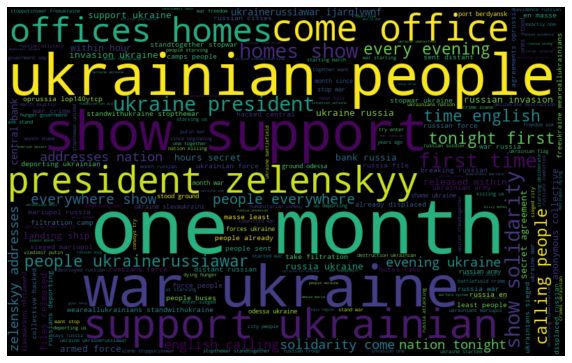

In [ ]:
all_words = ' '.join([text for text in data['Clean Tweet']])
wordcloud = WordCloud(stopwords = stopwords_set, width = 800, height = 500, random_state = 21, max_font_size =110).generate(all_words)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

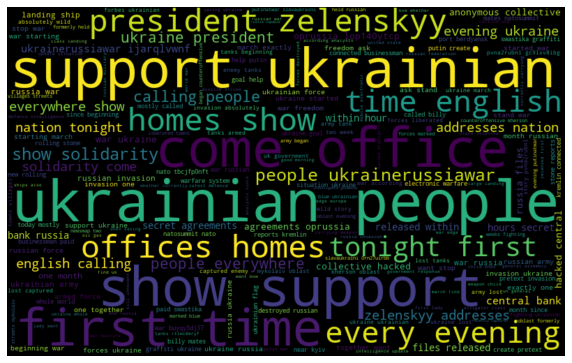

In [ ]:
positive_words =' '.join([text for text in data['Clean Tweet'][data['Sentiment'] == 1]])

wordcloud = WordCloud(stopwords = stopwords_set, width=800, height=500, random_state=21, max_font_size=110).generate(positive_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

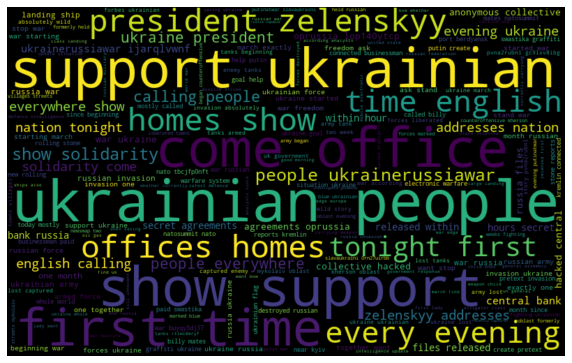

In [ ]:
negative_words =' '.join([text for text in data['Clean Tweet'][data['Sentiment'] == -1]])

wordcloud = WordCloud(stopwords = stopwords_set, width=800, height=500, random_state=21, max_font_size=110).generate(positive_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

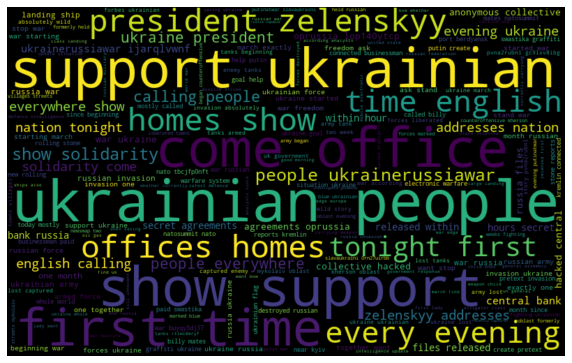

In [ ]:
neutral_words =' '.join([text for text in data['Clean Tweet'][data['Sentiment'] == 0]])

wordcloud = WordCloud(stopwords = stopwords_set, width=800, height=500, random_state=21, max_font_size=110).generate(positive_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
# function to collect hashtags
def hashtag_extract(x):
    hashtags = []
    # Loop over the words in the tweet
    for i in x:
        ht = re.findall(r"#(\w+)", i)
        hashtags.append(ht)

    return hashtags

In [ ]:
HT = hashtag_extract(data['text'])
HT = sum(HT,[])

In [ ]:
a = nltk.FreqDist(HT)
d = pd.DataFrame({'Hashtags' : list(a.keys()),
                  'Count' : list(a.values())})
d = d.nlargest(columns = 'Count', n= 10)

In [ ]:
x = d.Hashtags
y = d.Count

fig = go.Figure()
fig.add_trace(go.Bar(x = x, y = y))

fig.update_layout(
    title = 'Top Hashtags',
    height = 600,
    width = 1300
    )

fig.show(renderer = 'colab')

#WEB SCRAPPING

Scrapping of articles from criticalthreats.com website to  

In [ ]:
class Content: 
  def __init__(self, url, title, body):
    self.url = url
    self.title = title
    self.body = body

def getPage(url):
  req = requests.get(url)
  return soup(req.text, 'html.parser')

def scrapeAljazeera(url):
  ct_bs = getPage(url)
  # article_container = ct_bs.find_all('div', class_ = 'analysis-i ng-scope')
  # article = [titles.p for titles in ct_bs.find('div', {'class' : 'analysis-content an-body allow-usernotes content-filter'})]
  for title in ct_bs.find_all('section', id = 'main-content'):
    for other_title in title.h3:
      return other_title.text
      
  # title = ct_bs.find('h1').text
  # lines = ct_bs.select('div', {'class : analysis-content allow-usernotes content-filter'})
  # body = '\n'.join([line.text for line in lines])
  # for link in title:
  #   page = requests.get(link)
  #   bsobj = soup(page.content)
  #   body = '\n'.join([aljazeera_news.text.strip() for aljazeera_news in bsobj.findAll('div', {'class' : 'container container--grid container--article container--white container--vertical-padding' })])
  #     # print()
  return Content(url, title, body)


In [ ]:
import datetime

In [ ]:
date = datetime.date(2022, 3, 1)
today = date.today()
oneday = timedelta(days = 1)
date_counter = 0
titleN = []
article = []
all_articles = []
while date != today:
  ct_url = 'https://www.criticalthreats.org/analysis/russian-offensive-campaign-assessment-{}'.format(date.strftime('%B-%-d').lower())
  response = requests.get(ct_url)
  html = soup(response.text, 'html.parser')
  header = html.find_all('div', {'class' : 'view-wrapper'})
  for container in header: 
    titleN.append(container.find('h1', {'class' :'barred-heading'}).get_text().strip())
    # date = container.find('h3', {'class' : 'title-date'})
    body = container.find('div', {'class': 'analysis-content allow-usernotes content-filter'})
    for x in body.find_all('p'): 
      article.append(x.get_text().strip())
      for lis in article:
        all_articles.append(lis)
    # article = [x.get_text().strip() for x in body.find_all('p')]
    date_counter += 1 
    date += oneday


print('{\n "Title" : "',titleN,'", ')
# print('\n "Date" : "', date.get_text().strip(),'", ')
print('\n "Body" : "', article,'", }')

In [ ]:
title = pd.DataFrame (titleN, columns = ['Title'])
article_df = pd.DataFrame (article, columns = ['Article'])

In [ ]:
article_df[41:80]

In [ ]:
title